In [38]:
%matplotlib inline

import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook

In [39]:
data = pd.read_csv('building4.csv')
data['timestamp'] = pd.to_datetime(data['timestamp'])

In [40]:
data.head()

,timestamp,main_meter,sub_meter_1,sub_meter_2,building_number
0,2017-04-01 00:00:00,3472.022100,0.000000,1003.452471,4
1,2017-04-01 00:15:00,3994.211735,15.644386,1252.996941,4
2,2017-04-01 00:30:00,3518.666628,8.909244,990.175973,4
3,2017-04-01 00:45:00,3639.496844,0.000000,994.095052,4
4,2017-04-01 01:00:00,3503.013915,8.430219,927.320840,4


In [41]:
def get_units_time(df):
    df = df.set_index('timestamp')
    
    # Extract units of time from the timestamp
    df['min'] = df.index.minute
    df['hour'] = df.index.hour
    df['wday'] = df.index.dayofweek
    df['mday'] = df.index.day
    df['yday'] = df.index.dayofyear
    df['month'] = df.index.month
    df['is_sunday'] = (df.index.dayofweek == 6).astype(int)
    
    # Create a time of day to represent hours and minutes
    df['time'] = df['hour'] + (df['min'] / 60)
    df = df.drop(columns=['hour', 'min'])
    
    # Cyclical variable transformations
    
    # wday has period of 6
    df['wday_sin'] = np.sin(2 * np.pi * df['wday'] / 6)
    df['wday_cos'] = np.cos(2 * np.pi * df['wday'] / 6)
    
    # month has period of 12
    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
    
    # time has period of 24
    df['time_sin'] = np.sin(2 * np.pi * df['time'] / 24)
    df['time_cos'] = np.cos(2 * np.pi * df['time'] / 24)
    
    # turn the index into a column
    df = df.reset_index(level=0)
    
    return df

In [42]:
data=get_units_time(data)

In [43]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26400 entries, 0 to 26399
Data columns (total 17 columns):
timestamp          26400 non-null datetime64[ns]
main_meter         26400 non-null float64
sub_meter_1        26400 non-null float64
sub_meter_2        26400 non-null float64
building_number    26400 non-null int64
wday               26400 non-null int64
mday               26400 non-null int64
yday               26400 non-null int64
month              26400 non-null int64
is_sunday          26400 non-null int64
time               26400 non-null float64
wday_sin           26400 non-null float64
wday_cos           26400 non-null float64
month_sin          26400 non-null float64
month_cos          26400 non-null float64
time_sin           26400 non-null float64
time_cos           26400 non-null float64
dtypes: datetime64[ns](1), float64(10), int64(6)
memory usage: 3.4 MB


In [44]:
#Extract units of time from the timestamp
data = get_units_time(data)
data.head()

,timestamp,main_meter,sub_meter_1,sub_meter_2,building_number,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos
0,2017-04-01 00:00:00,3472.022100,0.000000,1003.452471,4,5,1,91,4,0,0.00,-0.866025,0.5,0.866025,-0.5,0.000000,1.000000
1,2017-04-01 00:15:00,3994.211735,15.644386,1252.996941,4,5,1,91,4,0,0.25,-0.866025,0.5,0.866025,-0.5,0.065403,0.997859
2,2017-04-01 00:30:00,3518.666628,8.909244,990.175973,4,5,1,91,4,0,0.50,-0.866025,0.5,0.866025,-0.5,0.130526,0.991445
3,2017-04-01 00:45:00,3639.496844,0.000000,994.095052,4,5,1,91,4,0,0.75,-0.866025,0.5,0.866025,-0.5,0.195090,0.980785
4,2017-04-01 01:00:00,3503.013915,8.430219,927.320840,4,5,1,91,4,0,1.00,-0.866025,0.5,0.866025,-0.5,0.258819,0.965926


In [45]:
data.describe()

,main_meter,sub_meter_1,sub_meter_2,building_number,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos
count,26400.000000,26400.000000,26400.000000,26400.0,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,2.640000e+04,26400.000000,2.640000e+04,2.640000e+04
mean,7352.705529,1013.178148,1962.098343,4.0,3.018182,15.781818,228.000000,8.007273,0.145455,11.875000,-0.003149,0.147273,-2.644102e-01,-0.151683,8.305646e-20,8.831320e-20
std,4741.938282,987.588705,830.038538,0.0,2.004496,8.823052,79.386641,2.579679,0.352565,6.927959,0.654361,0.741721,6.113409e-01,0.730326,7.071202e-01,7.071202e-01
min,391.046395,0.000000,114.074534,4.0,0.000000,1.000000,91.000000,4.000000,0.000000,0.000000,-0.866025,-1.000000,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00
25%,3993.116156,6.133886,1283.411081,4.0,1.000000,8.000000,159.000000,6.000000,0.000000,5.937500,-0.866025,-0.500000,-8.660254e-01,-0.866025,-7.071068e-01,-7.071068e-01
50%,5654.865534,578.571248,1895.318778,4.0,3.000000,16.000000,228.000000,8.000000,0.000000,11.875000,0.000000,0.500000,-5.000000e-01,-0.500000,6.123234e-17,-6.123234e-17
75%,8469.169740,2073.923372,2522.073852,4.0,5.000000,23.000000,297.000000,10.000000,0.000000,17.812500,0.866025,1.000000,1.224647e-16,0.500000,7.071068e-01,7.071068e-01
max,23174.609258,2127.910677,4392.073840,4.0,6.000000,31.000000,365.000000,12.000000,1.000000,23.750000,0.866025,1.000000,8.660254e-01,1.000000,1.000000e+00,1.000000e+00


### seasons
- 4-5 => 1
- 6-7 => 2
- 8-9-10 => 3
- 11 => 1
- 12 => 2
- 1-2 => 3
- 3 => 1

In [46]:
def get_seasons(x):
    if x in [3, 4, 5, 11]:
        return 1
    elif x in [6, 7, 12]:
        return 2
    elif x in [1, 2, 8, 9, 10]:
        return 3

In [47]:
data['seasons'] = data['month'].apply(get_seasons)

In [48]:
data.isnull().values.any()

False

In [49]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26400 entries, 0 to 26399
Data columns (total 18 columns):
timestamp          26400 non-null datetime64[ns]
main_meter         26400 non-null float64
sub_meter_1        26400 non-null float64
sub_meter_2        26400 non-null float64
building_number    26400 non-null int64
wday               26400 non-null int64
mday               26400 non-null int64
yday               26400 non-null int64
month              26400 non-null int64
is_sunday          26400 non-null int64
time               26400 non-null float64
wday_sin           26400 non-null float64
wday_cos           26400 non-null float64
month_sin          26400 non-null float64
month_cos          26400 non-null float64
time_sin           26400 non-null float64
time_cos           26400 non-null float64
seasons            26400 non-null int64
dtypes: datetime64[ns](1), float64(10), int64(7)
memory usage: 3.6 MB


In [157]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [158]:
cols = data.columns[5:]
cols

Index(['wday', 'mday', 'yday', 'month', 'is_sunday', 'time', 'wday_sin',
       'wday_cos', 'month_sin', 'month_cos', 'time_sin', 'time_cos',
       'seasons'],
      dtype='object')

In [159]:
cols = ['timestamp', 'sub_meter_2'] + list(cols)
cols

['timestamp',
 'sub_meter_2',
 'wday',
 'mday',
 'yday',
 'month',
 'is_sunday',
 'time',
 'wday_sin',
 'wday_cos',
 'month_sin',
 'month_cos',
 'time_sin',
 'time_cos',
 'seasons']

In [160]:
sub2 = data[cols]
sub2.head()

,timestamp,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
0,2017-04-01 00:00:00,1003.452471,5,1,91,4,0,0.00,-0.866025,0.5,0.866025,-0.5,0.000000,1.000000,1
1,2017-04-01 00:15:00,1252.996941,5,1,91,4,0,0.25,-0.866025,0.5,0.866025,-0.5,0.065403,0.997859,1
2,2017-04-01 00:30:00,990.175973,5,1,91,4,0,0.50,-0.866025,0.5,0.866025,-0.5,0.130526,0.991445,1
3,2017-04-01 00:45:00,994.095052,5,1,91,4,0,0.75,-0.866025,0.5,0.866025,-0.5,0.195090,0.980785,1
4,2017-04-01 01:00:00,927.320840,5,1,91,4,0,1.00,-0.866025,0.5,0.866025,-0.5,0.258819,0.965926,1


In [161]:
from sklearn.preprocessing import StandardScaler

In [162]:
sub2_sc = StandardScaler()
sub2['sub_meter_2'] = sub2_sc.fit_transform(sub2[['sub_meter_2']])

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [165]:
with open('building4_sub2_sc.pkl', 'wb') as f:
    pickle.dump(sub2_sc, f)

In [164]:
import pickle

In [166]:
sub2.describe()

,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
count,2.640000e+04,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,2.640000e+04,26400.000000,2.640000e+04,2.640000e+04,26400.000000
mean,-5.369316e-16,3.018182,15.781818,228.000000,8.007273,0.145455,11.875000,-0.003149,0.147273,-2.644102e-01,-0.151683,8.305646e-20,8.831320e-20,2.003636
std,1.000019e+00,2.004496,8.823052,79.386641,2.579679,0.352565,6.927959,0.654361,0.741721,6.113409e-01,0.730326,7.071202e-01,7.071202e-01,0.815761
min,-2.226473e+00,0.000000,1.000000,91.000000,4.000000,0.000000,0.000000,-0.866025,-1.000000,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00,1.000000
25%,-8.176730e-01,1.000000,8.000000,159.000000,6.000000,0.000000,5.937500,-0.866025,-0.500000,-8.660254e-01,-0.866025,-7.071068e-01,-7.071068e-01,1.000000
50%,-8.045509e-02,3.000000,16.000000,228.000000,8.000000,0.000000,11.875000,0.000000,0.500000,-5.000000e-01,-0.500000,6.123234e-17,-6.123234e-17,2.000000
75%,6.746507e-01,5.000000,23.000000,297.000000,10.000000,0.000000,17.812500,0.866025,1.000000,1.224647e-16,0.500000,7.071068e-01,7.071068e-01,3.000000
max,2.927601e+00,6.000000,31.000000,365.000000,12.000000,1.000000,23.750000,0.866025,1.000000,8.660254e-01,1.000000,1.000000e+00,1.000000e+00,3.000000


In [167]:
for i in range(1, 96*7):
    sub2["lag_sub2_{}".format(i)] = sub2['sub_meter_2'].shift(i)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [168]:
sub2[671:].isnull().values.any(), sub2[670:].isnull().values.any()

(False, True)

In [169]:
sub2 = sub2.iloc[671:]

In [170]:
sub2.shape

(25729, 686)

In [171]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [172]:
sub2.set_index('timestamp', drop=True, inplace=True)
sub2.head()

,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,...,lag_sub2_662,lag_sub2_663,lag_sub2_664,lag_sub2_665,lag_sub2_666,lag_sub2_667,lag_sub2_668,lag_sub2_669,lag_sub2_670,lag_sub2_671
timestamp,,,,,,,,,,,,,,,,,,,,,
2017-04-07 23:45:00,-1.111276,4,7,97,4,0,23.75,-0.866025,-0.5,0.866025,...,-1.042750,-0.948408,-1.252376,-1.155832,-1.078867,-1.246686,-1.166237,-1.170959,-0.854316,-1.154963
2017-04-08 00:00:00,-1.249495,5,8,98,4,0,0.00,-0.866025,0.5,0.866025,...,-1.132133,-1.042750,-0.948408,-1.252376,-1.155832,-1.078867,-1.246686,-1.166237,-1.170959,-0.854316
2017-04-08 00:15:00,-1.111878,5,8,98,4,0,0.25,-0.866025,0.5,0.866025,...,-1.107051,-1.132133,-1.042750,-0.948408,-1.252376,-1.155832,-1.078867,-1.246686,-1.166237,-1.170959
2017-04-08 00:30:00,-1.078087,5,8,98,4,0,0.50,-0.866025,0.5,0.866025,...,-0.873874,-1.107051,-1.132133,-1.042750,-0.948408,-1.252376,-1.155832,-1.078867,-1.246686,-1.166237
2017-04-08 00:45:00,-1.297618,5,8,98,4,0,0.75,-0.866025,0.5,0.866025,...,-0.920504,-0.873874,-1.107051,-1.132133,-1.042750,-0.948408,-1.252376,-1.155832,-1.078867,-1.246686


In [173]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [174]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [176]:
X, y = sub2.drop(columns = 'sub_meter_2'), sub2['sub_meter_2']
# reserve 30% of data for testing
#X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [30]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [31]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(50, 10))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=5,
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);

In [32]:
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(100, 10))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

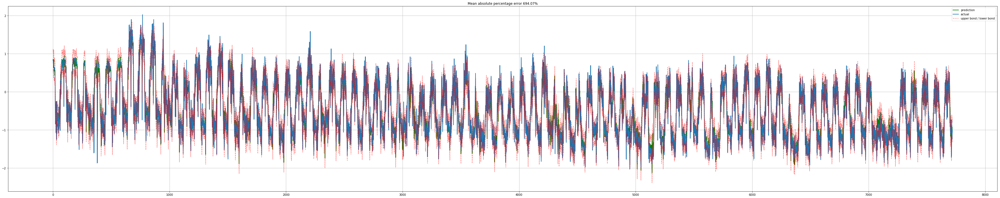

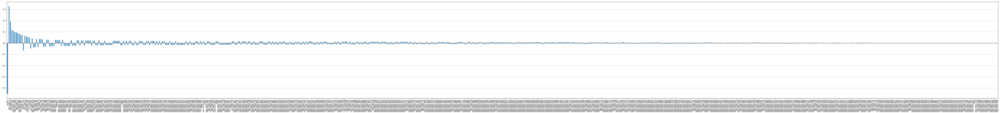

In [33]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

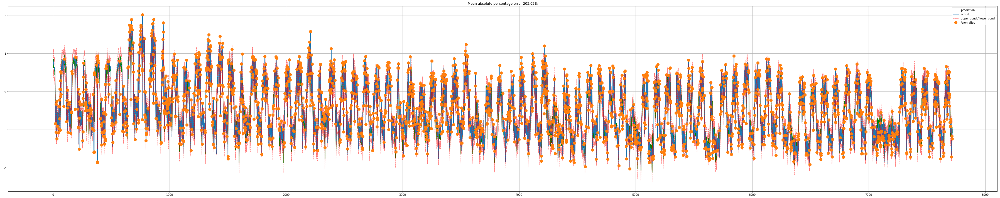

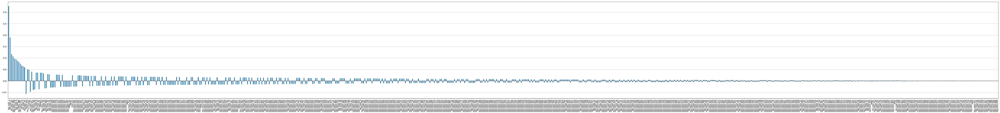

In [34]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=5)
ridge.fit(X_train, y_train)

plotModelResults(ridge, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

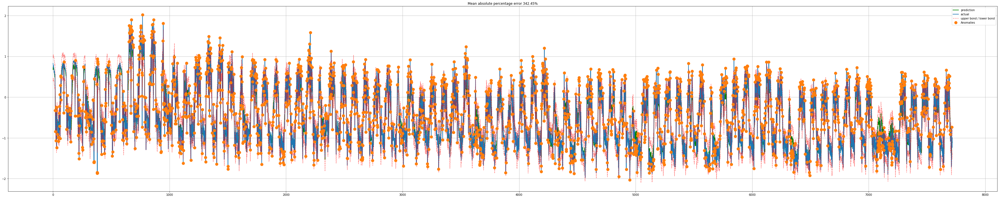

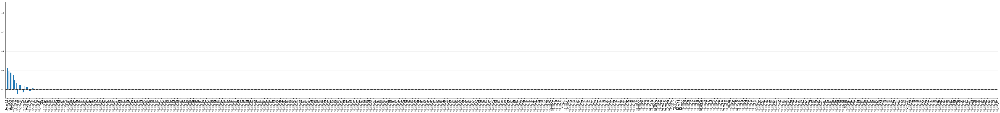

In [35]:
lasso = LassoCV(cv=5)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

In [177]:
from xgboost import XGBRegressor 
xgb = XGBRegressor(max_depth=10, n_estimators=500, n_jobs=-1)
xgb.fit(X, y)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[09:10:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=10, min_child_weight=1, missing=None, n_estimators=500,
       n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

In [178]:
with open('building4_sub2_xgb.pkl', 'wb') as f:
    pickle.dump(xgb, f)

In [ ]:
plotModelResults(xgb, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[23:24:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
lgb

In [ ]:
import lightgbm as lgb

In [ ]:
import lightgbm as lgb

d_train = lgb.Dataset(X_train, label=y_train)

params = {}
params['learning_rate'] = 0.003
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'mape'
params['sub_feature'] = 0.5
params['num_leaves'] = 10
params['min_data_in_leaf'] = 20
params['max_depth'] = 10
clf = lgb.train(params, d_train, 100)

## Sub Meter 1

In [179]:
cols = data.columns[5:]
cols

Index(['wday', 'mday', 'yday', 'month', 'is_sunday', 'time', 'wday_sin',
       'wday_cos', 'month_sin', 'month_cos', 'time_sin', 'time_cos',
       'seasons'],
      dtype='object')

In [180]:
cols = ['timestamp', 'sub_meter_1'] + list(cols)
cols

['timestamp',
 'sub_meter_1',
 'wday',
 'mday',
 'yday',
 'month',
 'is_sunday',
 'time',
 'wday_sin',
 'wday_cos',
 'month_sin',
 'month_cos',
 'time_sin',
 'time_cos',
 'seasons']

In [181]:
sub1 = data[cols]
sub1.head()

,timestamp,sub_meter_1,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
0,2017-04-01 00:00:00,0.000000,5,1,91,4,0,0.00,-0.866025,0.5,0.866025,-0.5,0.000000,1.000000,1
1,2017-04-01 00:15:00,15.644386,5,1,91,4,0,0.25,-0.866025,0.5,0.866025,-0.5,0.065403,0.997859,1
2,2017-04-01 00:30:00,8.909244,5,1,91,4,0,0.50,-0.866025,0.5,0.866025,-0.5,0.130526,0.991445,1
3,2017-04-01 00:45:00,0.000000,5,1,91,4,0,0.75,-0.866025,0.5,0.866025,-0.5,0.195090,0.980785,1
4,2017-04-01 01:00:00,8.430219,5,1,91,4,0,1.00,-0.866025,0.5,0.866025,-0.5,0.258819,0.965926,1


In [182]:
from sklearn.preprocessing import StandardScaler

In [183]:
sub1_sc = StandardScaler()
sub1['sub_meter_1'] = sub1_sc.fit_transform(sub1[['sub_meter_1']])

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [184]:
with open('building4_sub1_sc.pkl', 'wb') as f:
    pickle.dump(sub1_sc, f)

In [185]:
sub1.describe()

,sub_meter_1,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
count,2.640000e+04,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,2.640000e+04,26400.000000,2.640000e+04,2.640000e+04,26400.000000
mean,2.097985e-16,3.018182,15.781818,228.000000,8.007273,0.145455,11.875000,-0.003149,0.147273,-2.644102e-01,-0.151683,8.305646e-20,8.831320e-20,2.003636
std,1.000019e+00,2.004496,8.823052,79.386641,2.579679,0.352565,6.927959,0.654361,0.741721,6.113409e-01,0.730326,7.071202e-01,7.071202e-01,0.815761
min,-1.025930e+00,0.000000,1.000000,91.000000,4.000000,0.000000,0.000000,-0.866025,-1.000000,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00,1.000000
25%,-1.019719e+00,1.000000,8.000000,159.000000,6.000000,0.000000,5.937500,-0.866025,-0.500000,-8.660254e-01,-0.866025,-7.071068e-01,-7.071068e-01,1.000000
50%,-4.400771e-01,3.000000,16.000000,228.000000,8.000000,0.000000,11.875000,0.000000,0.500000,-5.000000e-01,-0.500000,6.123234e-17,-6.123234e-17,2.000000
75%,1.074096e+00,5.000000,23.000000,297.000000,10.000000,0.000000,17.812500,0.866025,1.000000,1.224647e-16,0.500000,7.071068e-01,7.071068e-01,3.000000
max,1.128763e+00,6.000000,31.000000,365.000000,12.000000,1.000000,23.750000,0.866025,1.000000,8.660254e-01,1.000000,1.000000e+00,1.000000e+00,3.000000


In [186]:
for i in range(1, 96*7):
    sub1["lag_sub1_{}".format(i)] = sub1['sub_meter_1'].shift(i)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [187]:
sub1[671:].isnull().values.any(), sub1[670:].isnull().values.any()

(False, True)

In [188]:
sub1 = sub1.iloc[671:]

In [189]:
sub1.shape

(25729, 686)

In [190]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [191]:
sub1.set_index('timestamp', drop=True, inplace=True)
sub1.head()

,sub_meter_1,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,...,lag_sub1_662,lag_sub1_663,lag_sub1_664,lag_sub1_665,lag_sub1_666,lag_sub1_667,lag_sub1_668,lag_sub1_669,lag_sub1_670,lag_sub1_671
timestamp,,,,,,,,,,,,,,,,,,,,,
2017-04-07 23:45:00,-1.019683,4,7,97,4,0,23.75,-0.866025,-0.5,0.866025,...,-1.025930,-1.025930,-1.004990,-1.014474,-1.018758,-1.017394,-1.025930,-1.016909,-1.010089,-1.025930
2017-04-08 00:00:00,-1.021732,5,8,98,4,0,0.00,-0.866025,0.5,0.866025,...,-1.011968,-1.025930,-1.025930,-1.004990,-1.014474,-1.018758,-1.017394,-1.025930,-1.016909,-1.010089
2017-04-08 00:15:00,-1.013927,5,8,98,4,0,0.25,-0.866025,0.5,0.866025,...,-1.021718,-1.011968,-1.025930,-1.025930,-1.004990,-1.014474,-1.018758,-1.017394,-1.025930,-1.016909
2017-04-08 00:30:00,-1.025930,5,8,98,4,0,0.50,-0.866025,0.5,0.866025,...,-1.008182,-1.021718,-1.011968,-1.025930,-1.025930,-1.004990,-1.014474,-1.018758,-1.017394,-1.025930
2017-04-08 00:45:00,-1.019727,5,8,98,4,0,0.75,-0.866025,0.5,0.866025,...,-1.019546,-1.008182,-1.021718,-1.011968,-1.025930,-1.025930,-1.004990,-1.014474,-1.018758,-1.017394


In [192]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [193]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [194]:
X, y = sub1.drop(columns = 'sub_meter_1'), sub1['sub_meter_1']
# reserve 30% of data for testing
#X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [51]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [52]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(50, 10))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=5,
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);

In [53]:
def plotModelResults1(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(50, 10))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.figure(figsize=(50, 10))
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=5,
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);

In [54]:
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(100, 10))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

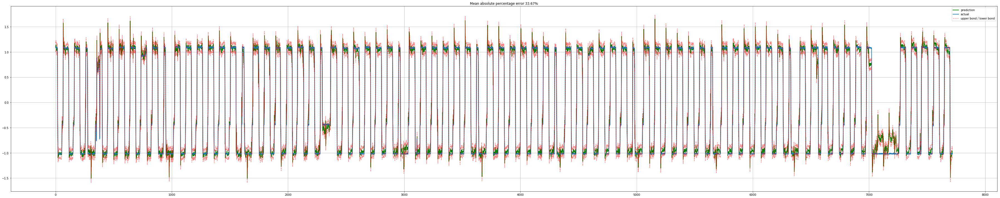

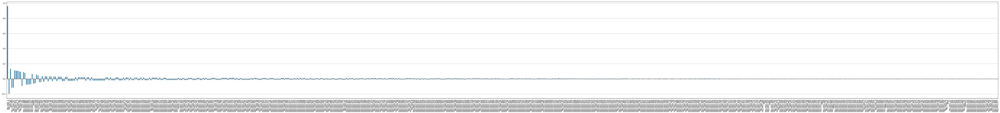

In [55]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

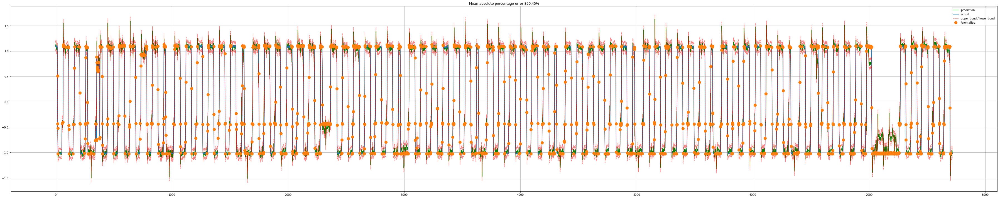

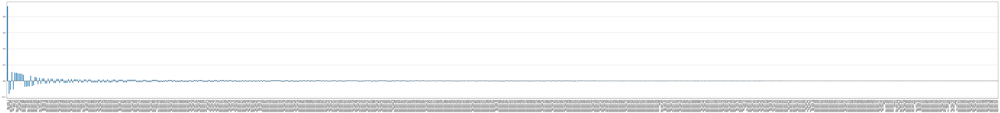

In [56]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=5)
ridge.fit(X_train, y_train)

plotModelResults(ridge, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

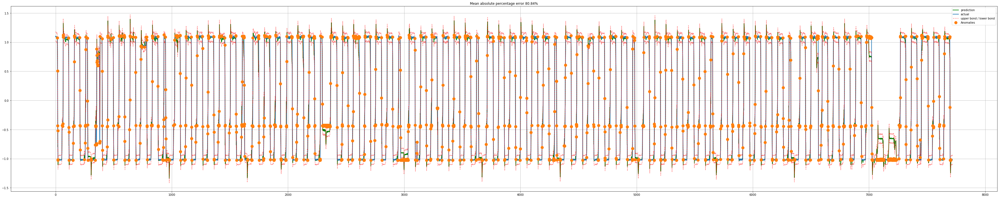

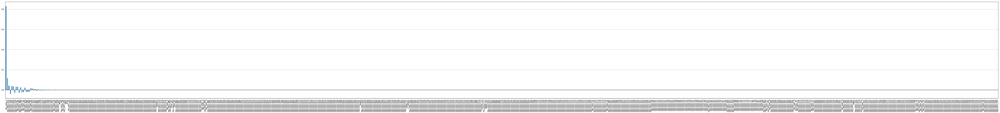

In [57]:
lasso = LassoCV(cv=5)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

In [195]:
from xgboost import XGBRegressor 

xgb = XGBRegressor(max_depth=3, n_estimators=500, n_jobs=-1)
xgb.fit(X, y)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[09:18:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=500,
       n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

In [196]:
with open('building4_sub1_xgb.pkl', 'wb') as f:
    pickle.dump(xgb, f)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[02:54:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[02:55:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[02:55:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[02:56:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[02:57:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


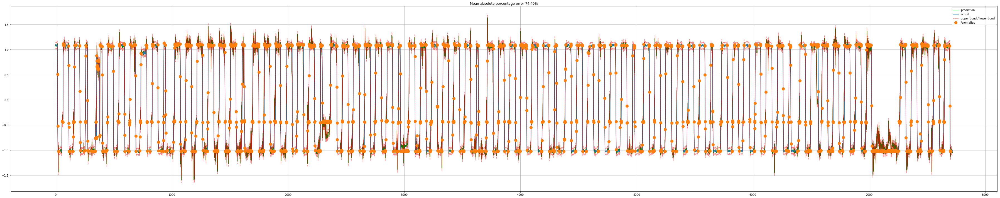

In [59]:
plotModelResults(xgb, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)

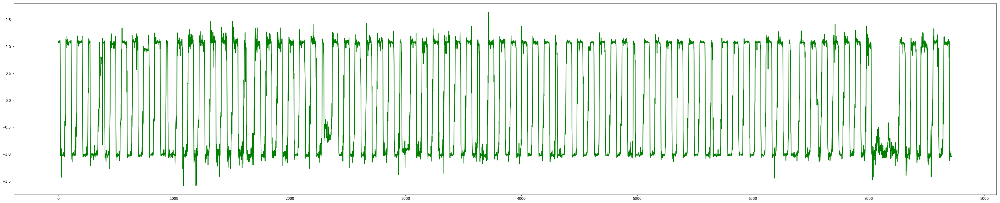

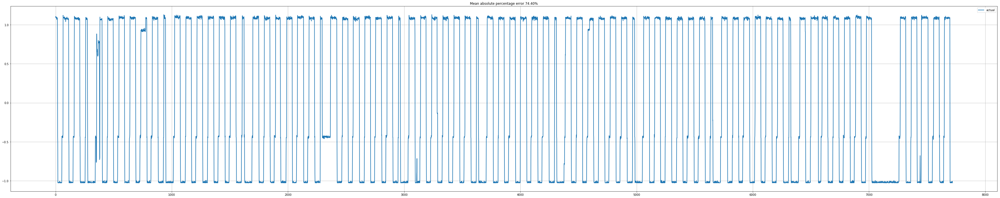

In [60]:
plotModelResults1(xgb, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=False, plot_anomalies=False)

In [61]:
"seasons" in X_train.columns

True

## Main Meter

In [50]:
# cols = data.columns[4:]
# cols

In [51]:
# cols = ['timestamp', 'sub_meter_1'] + list(cols)
# cols

In [52]:
main = data.copy(deep=True)
main.drop(columns=["building_number"],inplace=True)
main.head()

,timestamp,main_meter,sub_meter_1,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
0,2017-04-01 00:00:00,3472.022100,0.000000,1003.452471,5,1,91,4,0,0.00,-0.866025,0.5,0.866025,-0.5,0.000000,1.000000,1
1,2017-04-01 00:15:00,3994.211735,15.644386,1252.996941,5,1,91,4,0,0.25,-0.866025,0.5,0.866025,-0.5,0.065403,0.997859,1
2,2017-04-01 00:30:00,3518.666628,8.909244,990.175973,5,1,91,4,0,0.50,-0.866025,0.5,0.866025,-0.5,0.130526,0.991445,1
3,2017-04-01 00:45:00,3639.496844,0.000000,994.095052,5,1,91,4,0,0.75,-0.866025,0.5,0.866025,-0.5,0.195090,0.980785,1
4,2017-04-01 01:00:00,3503.013915,8.430219,927.320840,5,1,91,4,0,1.00,-0.866025,0.5,0.866025,-0.5,0.258819,0.965926,1


In [53]:
from sklearn.preprocessing import StandardScaler

In [54]:
main_sub2_sc = StandardScaler()
main['sub_meter_2'] = main_sub2_sc.fit_transform(main[['sub_meter_2']])

main_sub1_sc = StandardScaler()
main['sub_meter_1'] = main_sub1_sc.fit_transform(main[['sub_meter_1']])

main_sc = StandardScaler()
main['main_meter'] = main_sc.fit_transform(main[['main_meter']])

In [55]:
import pickle

In [56]:
with open('building4_main_sc.pkl', 'wb') as f:
    pickle.dump(main_sc, f)

In [57]:
main.describe()

,main_meter,sub_meter_1,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,wday_cos,month_sin,month_cos,time_sin,time_cos,seasons
count,2.640000e+04,2.640000e+04,2.640000e+04,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,26400.000000,2.640000e+04,26400.000000,2.640000e+04,2.640000e+04,26400.000000
mean,1.307750e-16,2.097985e-16,-5.369316e-16,3.018182,15.781818,228.000000,8.007273,0.145455,11.875000,-0.003149,0.147273,-2.644102e-01,-0.151683,8.305646e-20,8.831320e-20,2.003636
std,1.000019e+00,1.000019e+00,1.000019e+00,2.004496,8.823052,79.386641,2.579679,0.352565,6.927959,0.654361,0.741721,6.113409e-01,0.730326,7.071202e-01,7.071202e-01,0.815761
min,-1.468132e+00,-1.025930e+00,-2.226473e+00,0.000000,1.000000,91.000000,4.000000,0.000000,0.000000,-0.866025,-1.000000,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00,1.000000
25%,-7.084978e-01,-1.019719e+00,-8.176730e-01,1.000000,8.000000,159.000000,6.000000,0.000000,5.937500,-0.866025,-0.500000,-8.660254e-01,-0.866025,-7.071068e-01,-7.071068e-01,1.000000
50%,-3.580545e-01,-4.400771e-01,-8.045509e-02,3.000000,16.000000,228.000000,8.000000,0.000000,11.875000,0.000000,0.500000,-5.000000e-01,-0.500000,6.123234e-17,-6.123234e-17,2.000000
75%,2.354492e-01,1.074096e+00,6.746507e-01,5.000000,23.000000,297.000000,10.000000,0.000000,17.812500,0.866025,1.000000,1.224647e-16,0.500000,7.071068e-01,7.071068e-01,3.000000
max,3.336653e+00,1.128763e+00,2.927601e+00,6.000000,31.000000,365.000000,12.000000,1.000000,23.750000,0.866025,1.000000,8.660254e-01,1.000000,1.000000e+00,1.000000e+00,3.000000


In [58]:
for i in range(1, 96*7):
    main["lag_sub2_{}".format(i)] = main['sub_meter_2'].shift(i)
    main["lag_sub1_{}".format(i)] = main['sub_meter_1'].shift(i)
    main["lag_main_{}".format(i)] = main['main_meter'].shift(i)

In [59]:
main[671:].isnull().values.any(), main[670:].isnull().values.any()

(False, True)

In [60]:
main = main[671:]

In [61]:
main.shape

(25729, 2030)

In [62]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [63]:
main.set_index('timestamp', drop=True, inplace=True)
main.head()

,main_meter,sub_meter_1,sub_meter_2,wday,mday,yday,month,is_sunday,time,wday_sin,...,lag_main_668,lag_sub2_669,lag_sub1_669,lag_main_669,lag_sub2_670,lag_sub1_670,lag_main_670,lag_sub2_671,lag_sub1_671,lag_main_671
timestamp,,,,,,,,,,,,,,,,,,,,,
2017-04-07 23:45:00,-0.774981,-1.019683,-1.111276,4,7,97,4,0,23.75,-0.866025,...,-0.783072,-1.170959,-1.016909,-0.808554,-0.854316,-1.010089,-0.708267,-1.154963,-1.025930,-0.818390
2017-04-08 00:00:00,-0.778689,-1.021732,-1.249495,5,8,98,4,0,0.00,-0.866025,...,-0.811855,-1.166237,-1.025930,-0.783072,-1.170959,-1.016909,-0.808554,-0.854316,-1.010089,-0.708267
2017-04-08 00:15:00,-0.745231,-1.013927,-1.111878,5,8,98,4,0,0.25,-0.866025,...,-0.749737,-1.246686,-1.017394,-0.811855,-1.166237,-1.025930,-0.783072,-1.170959,-1.016909,-0.808554
2017-04-08 00:30:00,-0.786406,-1.025930,-1.078087,5,8,98,4,0,0.50,-0.866025,...,-0.777698,-1.078867,-1.018758,-0.749737,-1.246686,-1.017394,-0.811855,-1.166237,-1.025930,-0.783072
2017-04-08 00:45:00,-0.810169,-1.019727,-1.297618,5,8,98,4,0,0.75,-0.866025,...,-0.781481,-1.155832,-1.014474,-0.777698,-1.078867,-1.018758,-0.749737,-1.246686,-1.017394,-0.811855


In [64]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [65]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [66]:
X, y = main.drop(columns = 'main_meter'), main['main_meter']
# reserve 30% of data for testing
#X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [122]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [123]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(50, 10))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=5,
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);

In [124]:
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(100, 10))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

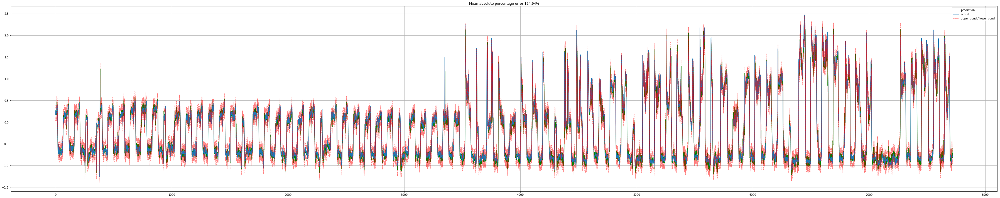

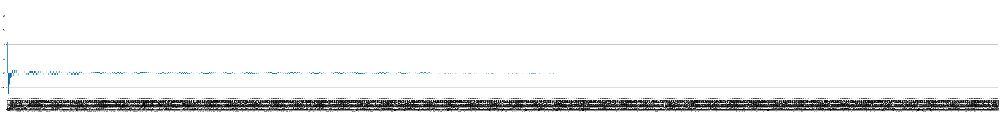

In [125]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

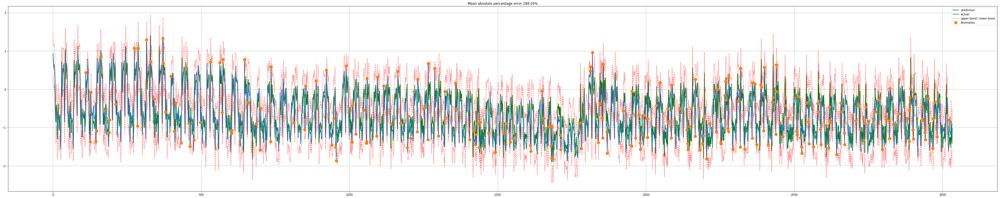

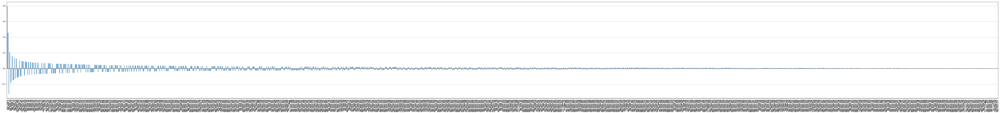

In [148]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=5)
ridge.fit(X_train, y_train)

plotModelResults(ridge, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

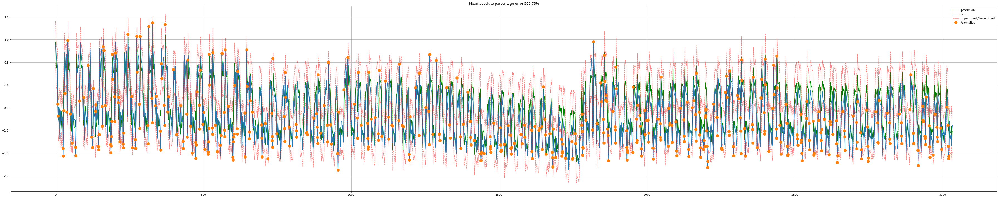

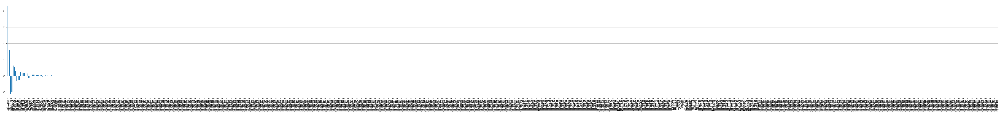

In [149]:
lasso = LassoCV(cv=5)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

In [67]:
from xgboost import XGBRegressor 

xgb = XGBRegressor(max_depth=3, n_estimators=500, n_jobs=-1)
xgb.fit(X, y)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:51:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=500,
       n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)

In [68]:
with open('building4_main_xgb.pkl', 'wb') as f:
    pickle.dump(xgb, f)

/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:11:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:13:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:15:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:16:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/home/faculty/debasis/anaconda3/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[03:18:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


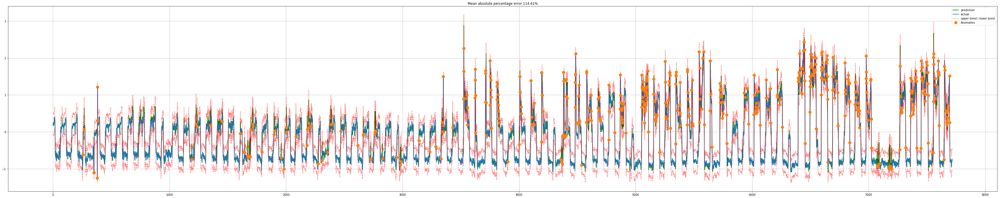

In [127]:
plotModelResults(xgb, 
                 X_train=X_train,
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)